<a href="https://colab.research.google.com/github/accoelhos/processamento-de-imagens/blob/main/aula01/aula.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Aula 24/02

- Livro recomendado: processamento digital de imagens 3 edição

- Imagem -> conj. de matrizes (pixel)
- **Amostragem** : número de ponotos amosrados de uma img digitalizada (resolução)
- **Quantização** : qtd de níveis de tons que pode ser atribuído a cada ponto digitalizado
- Faixa de variação de tom: 0 até 255 (preto até branco absoluto)
- Resolução tem a ver com a amostragem. Custa armazenamento.
- Um pixel é caracterizado pelo valor de tonalidade de cor e pela sua localização na imagem  
- Resol. Espacial -> Quanto maior o número de pixels, melhor é a qualidade da imagem
- Imagens coloridas: multibandas. Cada pixel possui n bandas espectrais.
- Histograma de uma imagem: quantas vezes cada cor aparece em uma imagem. Por exemplo, quantas vezes aparece o 0, o 1.. até o 255.
- É possível remover elementos utilizando histograma, basta remover na faixa da cor do elemento em questão.
- Também podemos alterar o tom das imagens e o brilho por meio das curvas de tom e histogramas.



largura em pixels:  1179
altura em pixels:  1068
qtd de canais:  3


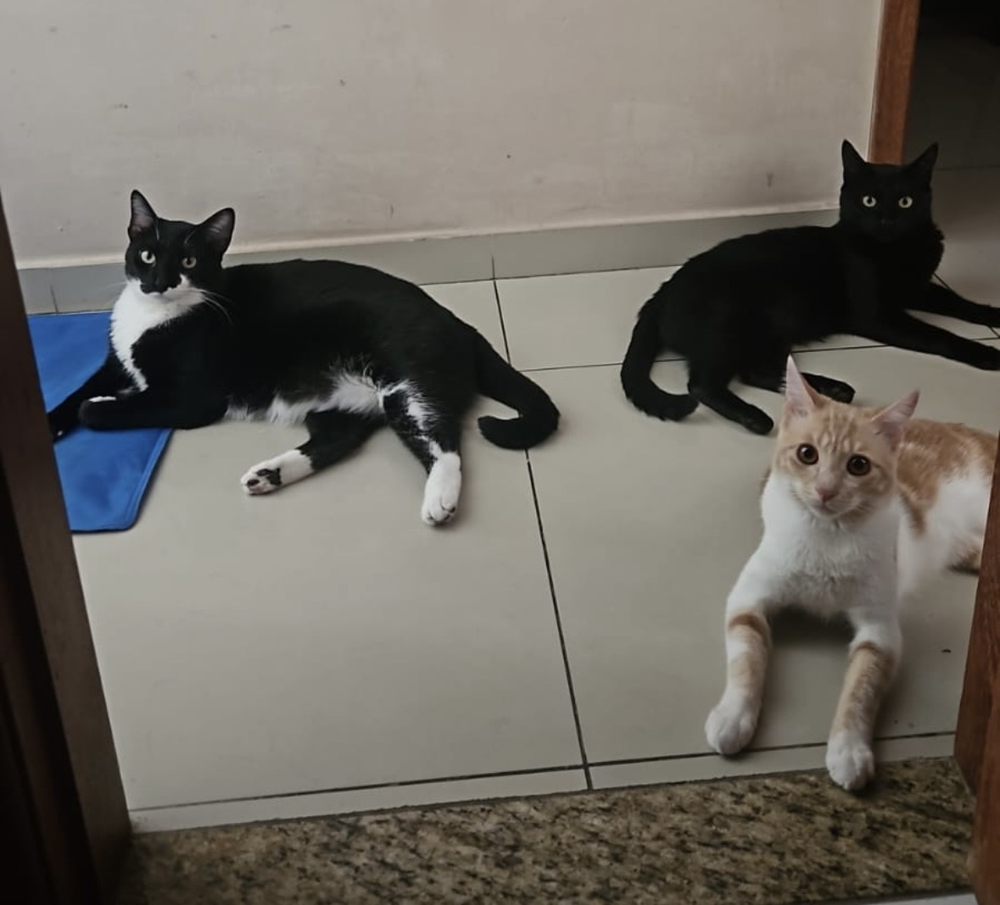

canal blue


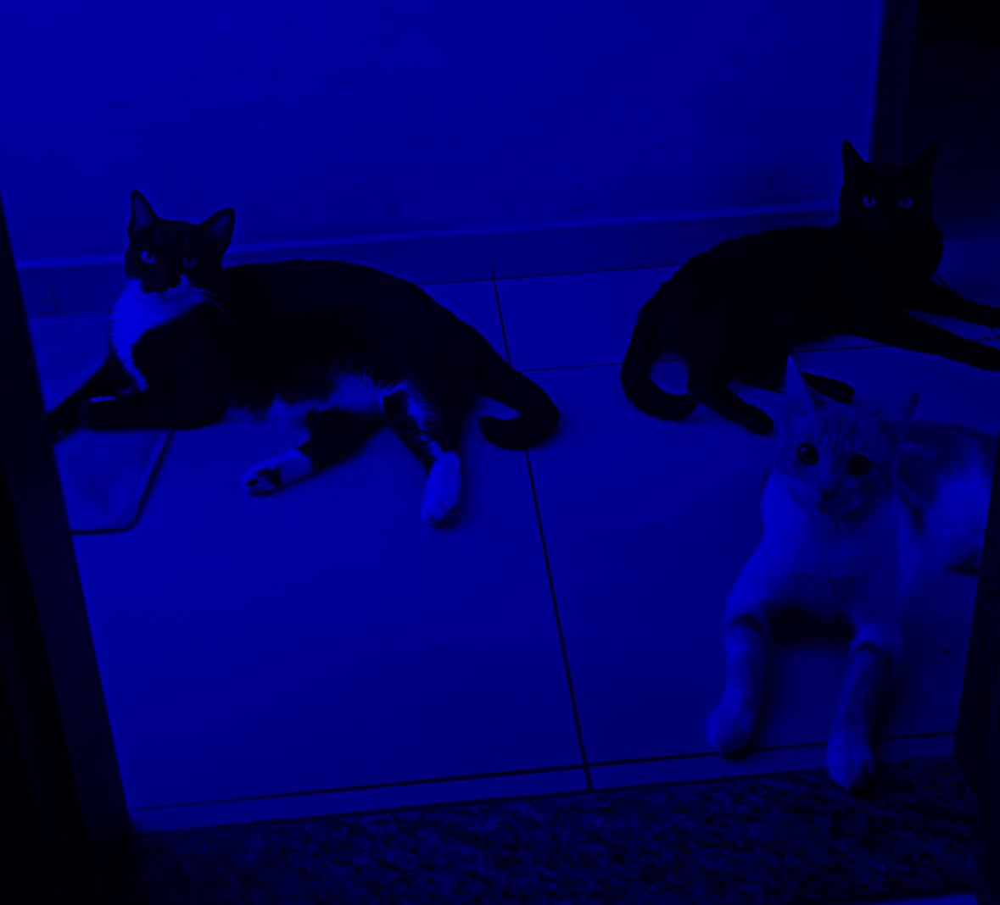

canal green


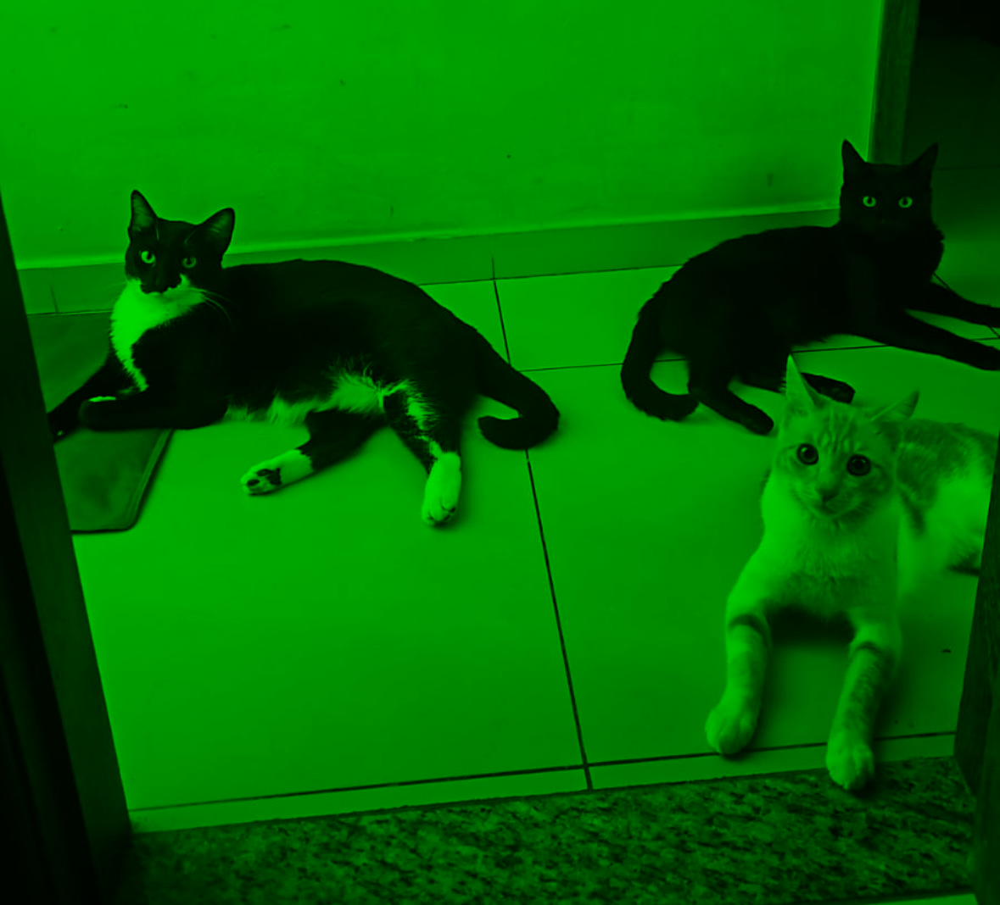

canal red


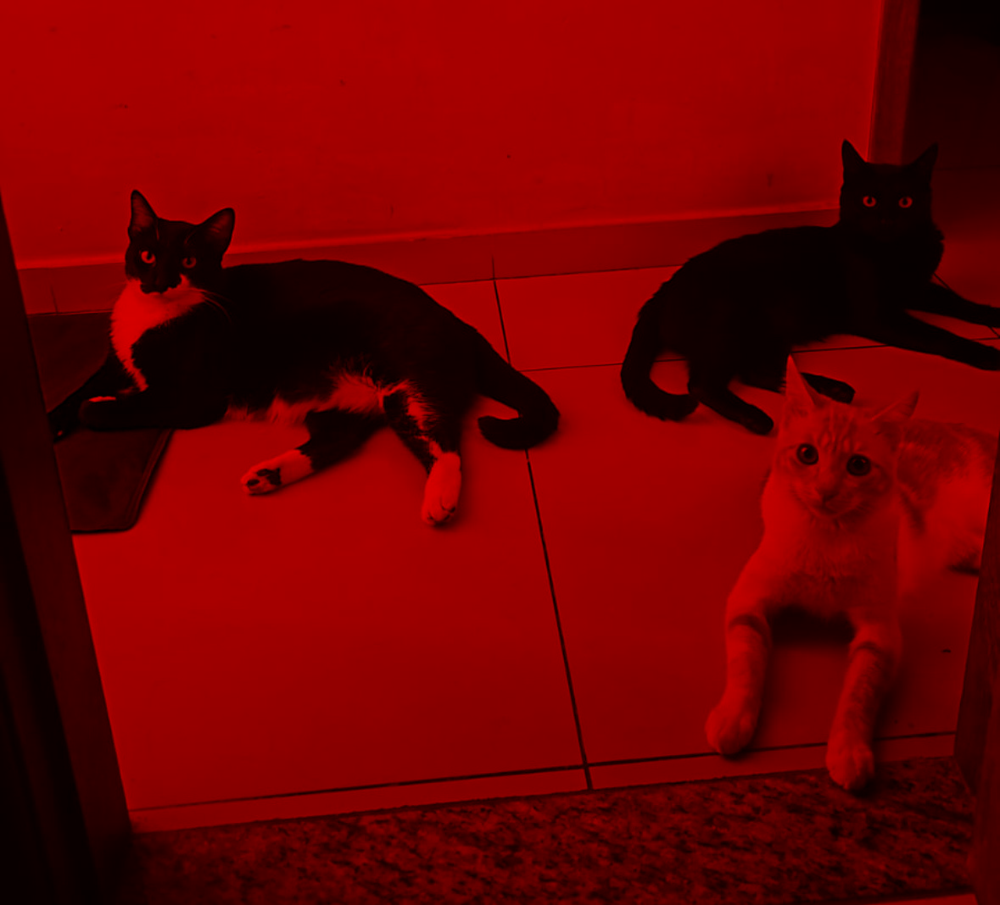

canal cinza


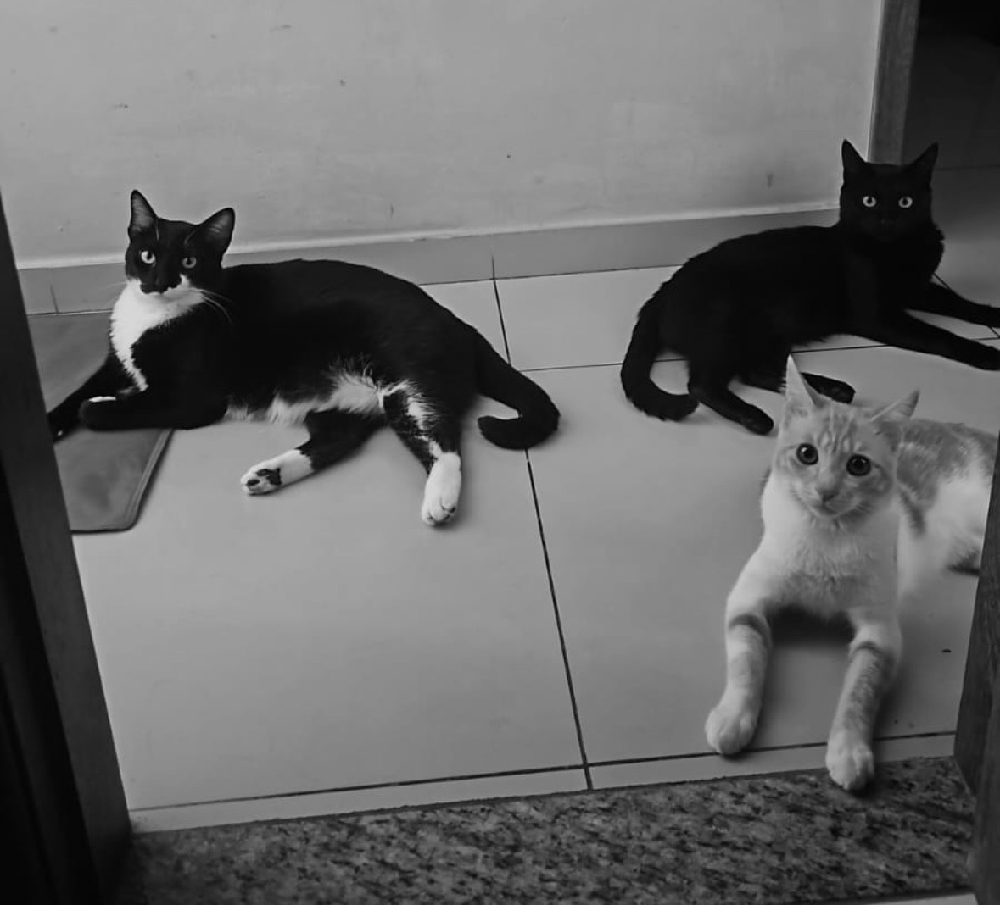

In [ ]:
# codigo da aula 24/02

# importacoes
import cv2 #visao computacional
from google.colab.patches import cv2_imshow
import numpy # trabalhar com matrizes

# leitura da imagem com a funcao imread()
imagem = cv2.imread('/gatos.jpg')
# a img eh armazenada na variavel imagem
# a imagem eh uma magriz de 3 dimensoes -> 3 canais RGB (red, green, blue), mas a ordem no python é bgr
# cada celula da matriz eh um pixel com valor de 0 a 255
# cada celula contem um inteiro de 8 bits sem sinal (uint8)
# cada pixel eh formado por uma tupla de 3 inteiros de 8 bits

# largura da imagem
print('largura em pixels: ', imagem.shape[1])

# altura da imagem
print('altura em pixels: ', imagem.shape[0])

# qtd de canais da imagem (colorida possui 3 canais)
print('qtd de canais: ', imagem.shape[2])

# mostra img na tela com imshow
cv2_imshow(imagem)
cv2.waitKey(0) # espera o usuario apertar uma tecla para fechar a janela

# salvar a img no disco com a funcao imwrite()
cv2.imwrite('imagem_copia.jpg', imagem) # salva a img com o nome 'imagem_copia.jpg'

# ------- FILTROS DE CORES BGR --------

# (b,g,r) = imagem[0,0] -> orgem no python é bgr

# matrizes de zeros com numpy para criar os canais de cores

# criando as matrizes de zeros
canalBlue = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalGreen = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalRed = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)

# preenchendo as matrizes para cada cor
canalBlue[:,:,0] = imagem[:,:,0]
canalGreen[:,:,1] = imagem[:,:,1]
canalRed[:,:,2] = imagem[:,:,2]

# exibindo
print("canal blue")
cv2_imshow(canalBlue)
print("canal green")
cv2_imshow(canalGreen)
print("canal red")
cv2_imshow(canalRed)

# --------- FILTRO DE TONS DE CINZA COM A MÉDIA DOS TENSORES --------

# tons de cinza é só o img shape 0 e o img shape 1
# pegar os valores e dividir por 3 primeiro

imgCinza = numpy.zeros((imagem.shape[0], imagem.shape[1]), dtype=numpy.uint8)

# for para calcular por cada canal
for i in range (0, imagem.shape[0]):
  for j in range (0, imagem.shape[1]):
    imgCinza[i,j] = (imagem[i][j].sum()//3) # media aritmetica dos canais

#

# exibindo
print("canal cinza")

cv2_imshow(imgCinza)



# Aula 03/03

# Criando histogramas

- Quando, no histograma, as colunas ficam na mesma região, temos um baixo contraste
- Quando as colunas estão mais espalhada ao longo da faixa, a imagem tem melhor contraste
- Quando temos mais colunas mais próximas ao 255, a imagem é mais clara
- Quando temos mais colunas mais próximas do 0, a imagem é mais escura

# Sistemas de visão binária

- Identificar objetos de uma imagem

## Agrupamento por limiar

- em um hist. bimodal, podemos estabelecer um limiar entre as duas tonalidades, sendo possível remover algum elemento por meio de um ponto de corte
- Podemos alterar os valores de frequência a partir de determinada faixa, para "manipular" a imagem e remover ou transformar alguma parte da imagem
- Tarefa: pegar uma imagem que gere um hist bimodal e separa a parte clara da parte escura

largura em pixels:  730
altura em pixels:  548
qtd de canais:  3


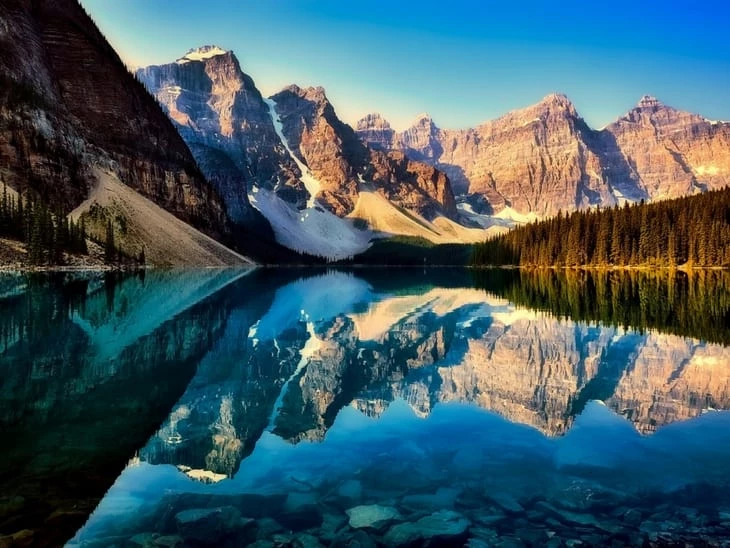

canal blue


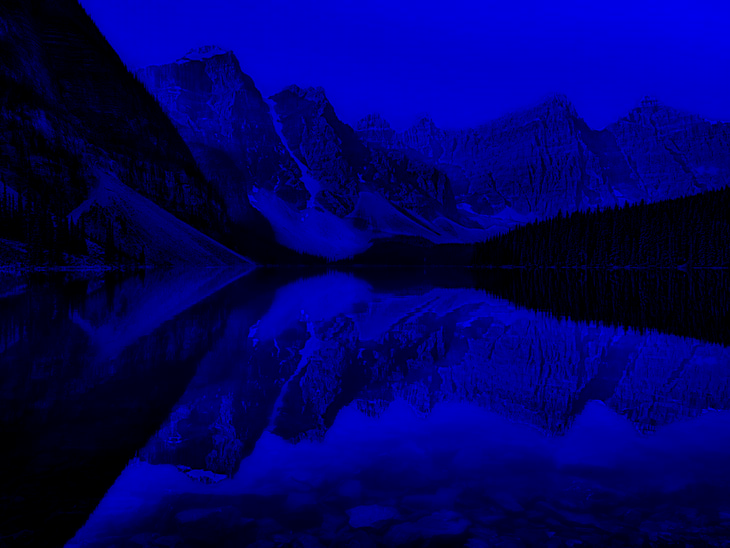

canal green


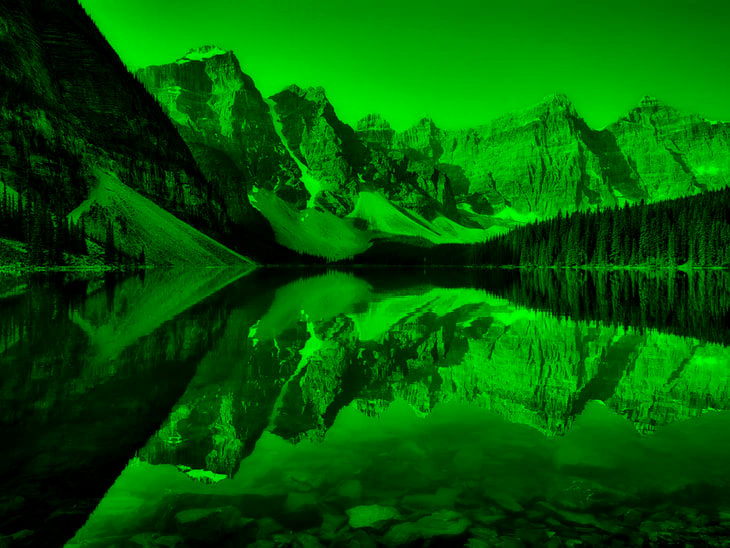

canal red


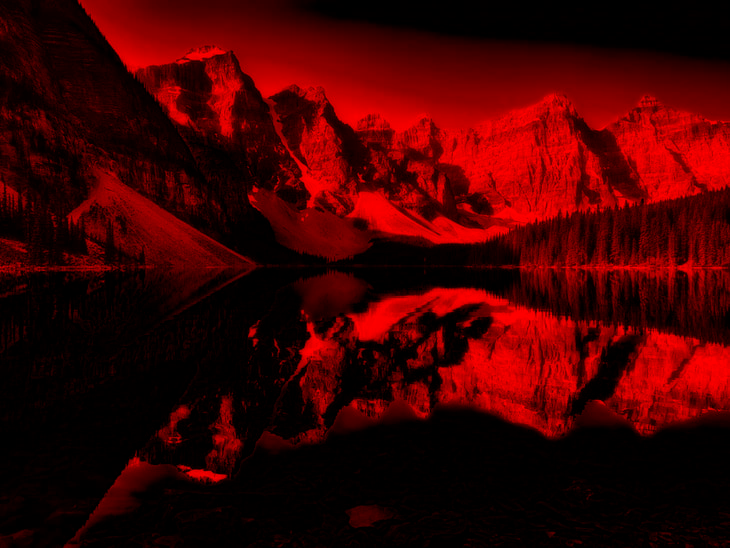

canal cinza


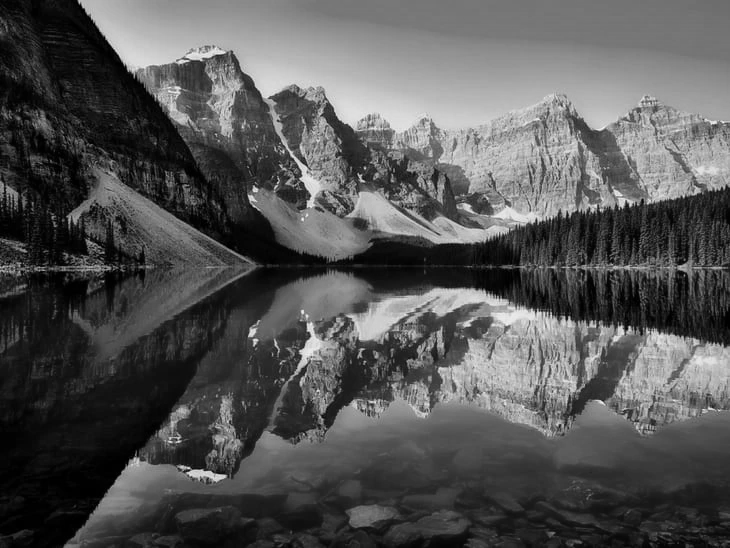

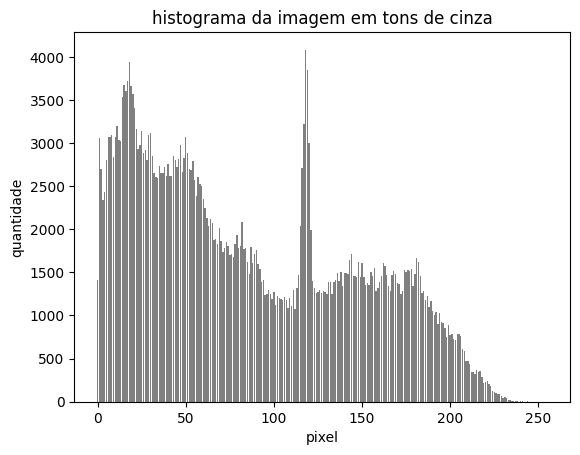

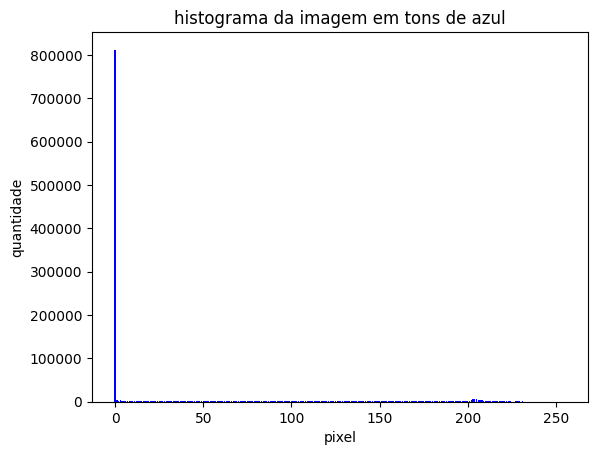

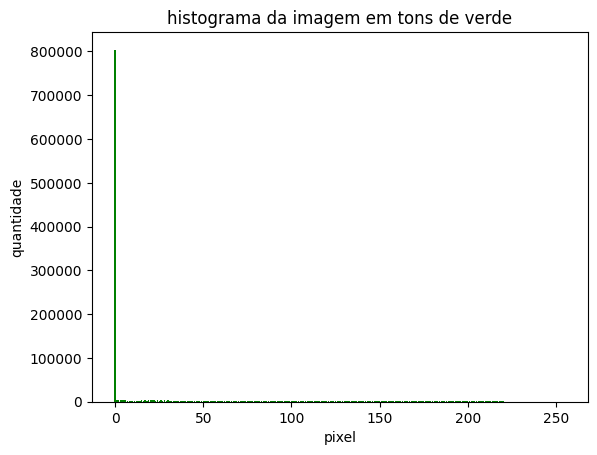

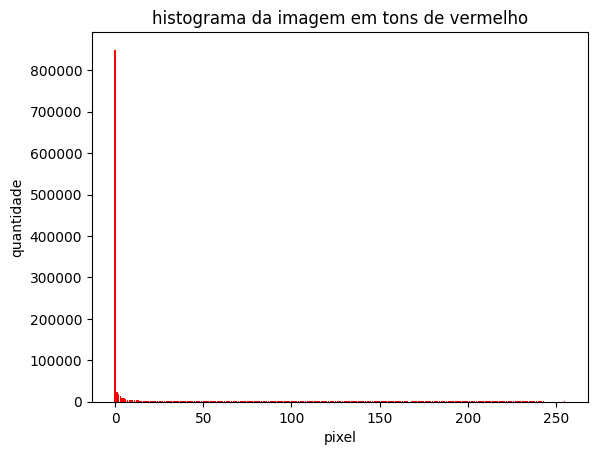

In [ ]:
# codigo da aula 24/02

# importacoes
import cv2 #visao computacional

import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy # trabalhar com matrizes

# leitura da imagem com a funcao imread()
imagem = cv2.imread('/foto.jpg')
# a img eh armazenada na variavel imagem
# a imagem eh uma magriz de 3 dimensoes -> 3 canais RGB (red, green, blue), mas a ordem no python é bgr
# cada celula da matriz eh um pixel com valor de 0 a 255
# cada celula contem um inteiro de 8 bits sem sinal (uint8)
# cada pixel eh formado por uma tupla de 3 inteiros de 8 bits

# largura da imagem
print('largura em pixels: ', imagem.shape[1])

# altura da imagem
print('altura em pixels: ', imagem.shape[0])

# qtd de canais da imagem (colorida possui 3 canais)
print('qtd de canais: ', imagem.shape[2])

# mostra img na tela com imshow
cv2_imshow(imagem)
cv2.waitKey(0) # espera o usuario apertar uma tecla para fechar a janela

# salvar a img no disco com a funcao imwrite()
cv2.imwrite('imagem_copia.jpg', imagem) # salva a img com o nome 'imagem_copia.jpg'

# ------- FILTROS DE CORES BGR --------

# (b,g,r) = imagem[0,0] -> orgem no python é bgr

# matrizes de zeros com numpy para criar os canais de cores

# criando as matrizes de zeros
canalBlue = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalGreen = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalRed = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)

# preenchendo as matrizes para cada cor
canalBlue[:,:,0] = imagem[:,:,0]
canalGreen[:,:,1] = imagem[:,:,1]
canalRed[:,:,2] = imagem[:,:,2]

# exibindo
print("canal blue")
cv2_imshow(canalBlue)
print("canal green")
cv2_imshow(canalGreen)
print("canal red")
cv2_imshow(canalRed)

# --------- FILTRO DE TONS DE CINZA COM A MÉDIA DOS TENSORES --------

# tons de cinza é só o img shape 0 e o img shape 1
# pegar os valores e dividir por 3 primeiro

imgCinza = numpy.zeros((imagem.shape[0], imagem.shape[1]), dtype=numpy.uint8)

# for para calcular por cada canal
for i in range (0, imagem.shape[0]):
  for j in range (0, imagem.shape[1]):
    imgCinza[i,j] = (imagem[i][j].sum()//3) # media aritmetica dos canais

# exibindo
print("canal cinza")

cv2_imshow(imgCinza)

# **********************************************************************************************
# TAREFA AULA 03/03 ----> FAZER UM HISTOGRAMA COM OS TONS DE CINZA COM UMA LISTA
# **********************************************************************************************

# fazer a lista para guardar os valores da escala de cinzas, cada posicao representa a frequencia. A lista será o histograma

# cria eixo x com zeros
pixel = 256*[0]
for i in range (256):
  pixel[i] = i

# para fazer o histograma, temos que criar um for para varrer a imagem e obter as frequencias
# criando lista de frequencias (histograma)
histogramaCinza = 256 * [0]
histogramaBlue = 256 * [0]
histogramaGreen = 256 * [0]
histogramaRed = 256 * [0]

# percorrendo a imagem em tons de cinza
for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    histogramaCinza[valor] += 1    # soma 1 na posicao correspondente

# nome do eixo x
plt.xlabel('pixel')
# nome do eixo y
plt.ylabel('quantidade')

# titulo do grafico
plt.title('histograma da imagem em tons de cinza')
plt.bar(pixel, histogramaCinza, color='gray') # esse histograma deve ser o array com os valores de frequencia da imagem, citado em comentario anterior
plt.show()


# **********************************************************************************************
# HISTOGRAMA COM CANAIS RGB
# **********************************************************************************************
def histogramaCanaisRGB(canal, titulo, cor):

  histogramaRGB = 256 * [0]
  for i in range(0, canal.shape[0]):
    for j in range(0, canal.shape[1]):
      for k in range(0, canal.shape[2]):
        valor = canal[i, j, k]     # valor do pixel (0 a 255)
        histogramaRGB[valor] += 1    # soma 1 na posicao correspondente

  # nome do eixo x
  plt.xlabel('pixel')
  # nome do eixo y
  plt.ylabel('quantidade')

  # titulo do grafico
  plt.title(titulo)
  plt.bar(pixel, histogramaRGB, color=cor) # esse histograma deve ser o array com os valores de frequencia da imagem, citado em comentario anterior
  plt.show()

  return histogramaRGB

histogramaBlue = histogramaCanaisRGB(canalBlue, 'histograma da imagem em tons de azul', 'blue')
histogramaGreen = histogramaCanaisRGB(canalGreen, 'histograma da imagem em tons de verde', 'green')
histogramaRed = histogramaCanaisRGB(canalRed, 'histograma da imagem em tons de vermelho', 'red')



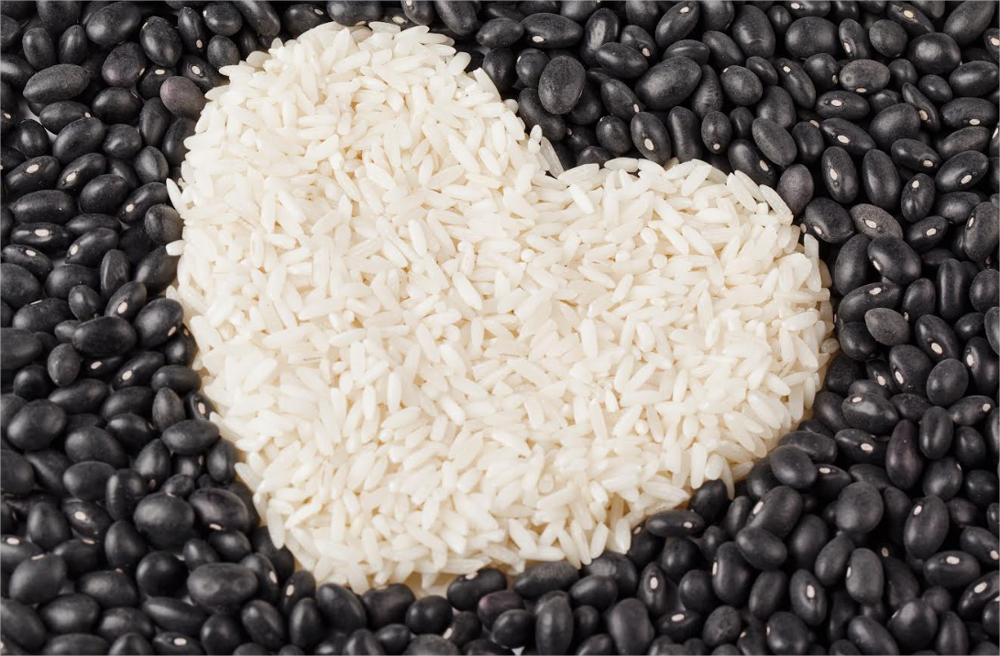

canal cinza


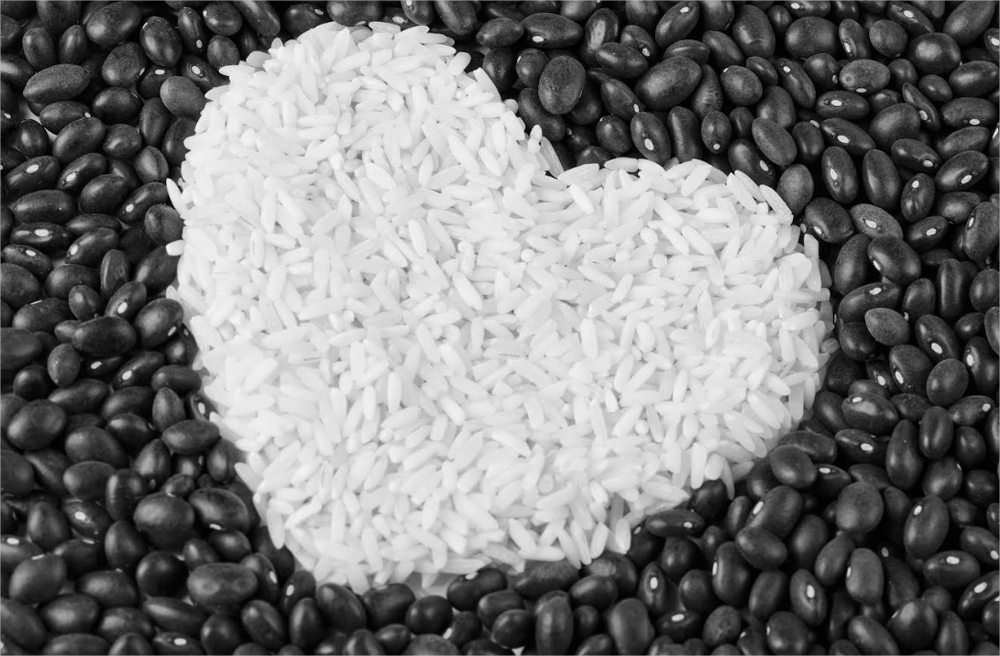

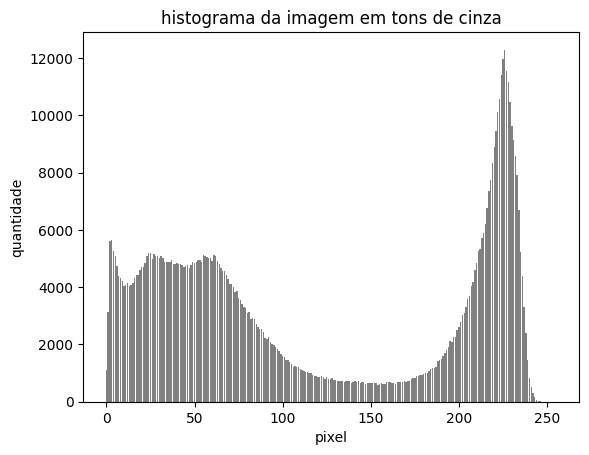

Mantendo o feijão


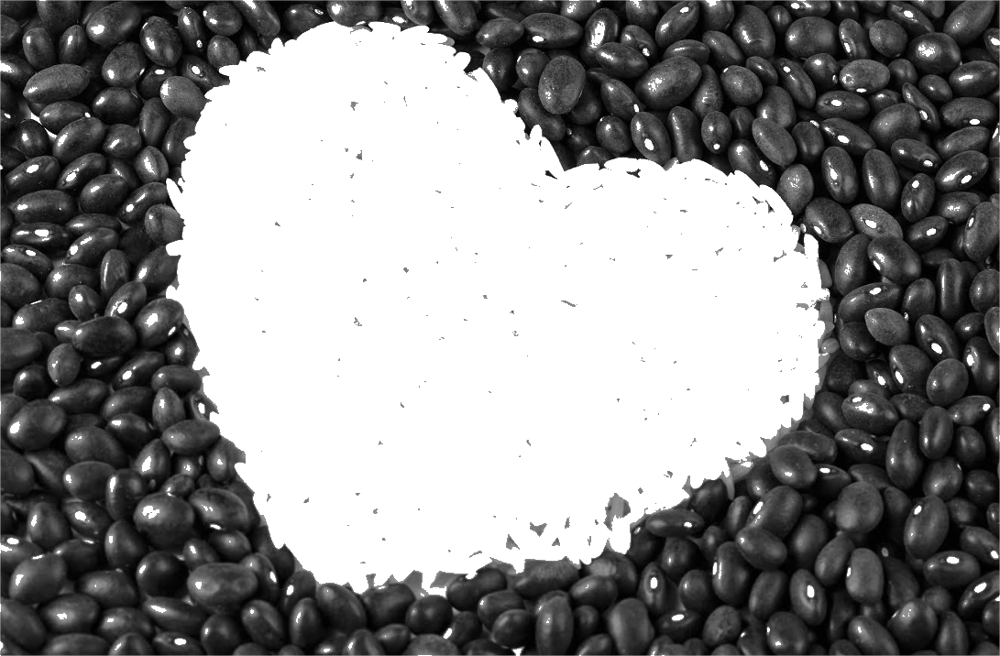

Mantendo o arroz


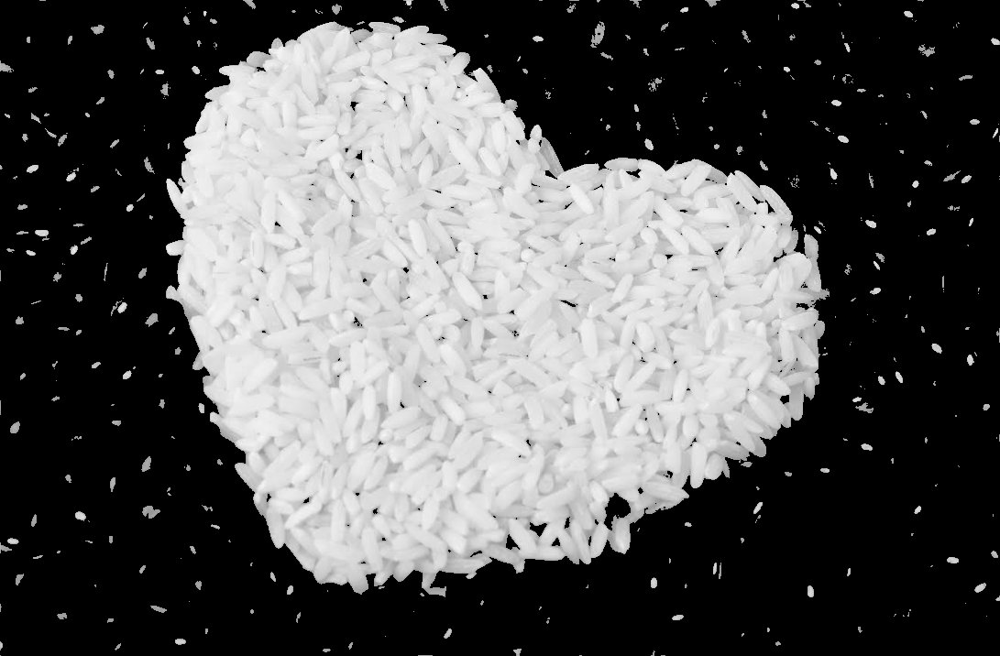

In [ ]:
# **********************************************
# AGRUPAMENTO POR LIMIAR
# **********************************************

# codigo da aula 24/02

# importacoes
import cv2 #visao computacional

import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy # trabalhar com matrizes

# leitura da imagem com a funcao imread()
img = cv2.imread('/foto2.png')
imagem = img.copy()
# a img eh armazenada na variavel imagem
# a imagem eh uma magriz de 3 dimensoes -> 3 canais RGB (red, green, blue), mas a ordem no python é bgr
# cada celula da matriz eh um pixel com valor de 0 a 255
# cada celula contem um inteiro de 8 bits sem sinal (uint8)
# cada pixel eh formado por uma tupla de 3 inteiros de 8 bits

# mostra img na tela com imshow
cv2_imshow(imagem)
cv2.waitKey(0) # espera o usuario apertar uma tecla para fechar a janela

# salvar a img no disco com a funcao imwrite()
cv2.imwrite('imagem2_copia.jpg', imagem) # salva a img com o nome 'imagem_copia.jpg'

# ------- FILTROS DE CORES BGR --------

# (b,g,r) = imagem[0,0] -> orgem no python é bgr

# matrizes de zeros com numpy para criar os canais de cores

# criando as matrizes de zeros
canalBlue = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalGreen = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalRed = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)

# preenchendo as matrizes para cada cor
canalBlue[:,:,0] = imagem[:,:,0]
canalGreen[:,:,1] = imagem[:,:,1]
canalRed[:,:,2] = imagem[:,:,2]

# --------- FILTRO DE TONS DE CINZA COM A MÉDIA DOS TENSORES --------

# tons de cinza é só o img shape 0 e o img shape 1
# pegar os valores e dividir por 3 primeiro

imgCinza = numpy.zeros((imagem.shape[0], imagem.shape[1]), dtype=numpy.uint8)

# for para calcular por cada canal
for i in range (0, imagem.shape[0]):
  for j in range (0, imagem.shape[1]):
    imgCinza[i,j] = (imagem[i][j].sum()//3) # media aritmetica dos canais

# exibindo
print("canal cinza")

cv2_imshow(imgCinza)

# **********************************************************************************************
# TAREFA AULA 03/03 ----> FAZER UM HISTOGRAMA COM OS TONS DE CINZA COM UMA LISTA
# **********************************************************************************************

# fazer a lista para guardar os valores da escala de cinzas, cada posicao representa a frequencia. A lista será o histograma

# cria eixo x com zeros
pixel = 256*[0]
for i in range (256):
  pixel[i] = i

# para fazer o histograma, temos que criar um for para varrer a imagem e obter as frequencias
# criando lista de frequencias (histograma)
histogramaCinza = 256 * [0]

# percorrendo a imagem em tons de cinza
for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    histogramaCinza[valor] += 1    # soma 1 na posicao correspondente

# nome do eixo x
plt.xlabel('pixel')
# nome do eixo y
plt.ylabel('quantidade')

# titulo do grafico
plt.title('histograma da imagem em tons de cinza')
plt.bar(pixel, histogramaCinza, color='gray') # esse histograma deve ser o array com os valores de frequencia da imagem, citado em comentario anterior
plt.show()


# **********************************************************************************************
# TAREFA AULA 03/03 ----> AGRUPAMENTO POR LIMIAR
# **********************************************************************************************

# pegar uma imagem que gere um hist bimodal e separa a parte clara da parte escura (USANDO A FOTO2)
# definir um ponto de corte no histograma
# Ponto de Corte escolhido como 150 após olhar no histograma de tons cinza

resultadoFeijao = numpy.zeros((imgCinza.shape[0], imgCinza.shape[1]), dtype=numpy.uint8)

for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    if valor > 150:
      resultadoFeijao[i, j] = 255  # branco
    else:
      resultadoFeijao[i, j] = valor

print("Mantendo o feijão")
cv2_imshow(resultadoFeijao)

resultadoArroz = numpy.zeros((imgCinza.shape[0], imgCinza.shape[1]), dtype=numpy.uint8)

for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    if valor < 150:
      resultadoArroz[i, j] = 0  # branco
    else:
      resultadoArroz[i, j] = valor

print("Mantendo o arroz")
cv2_imshow(resultadoArroz)


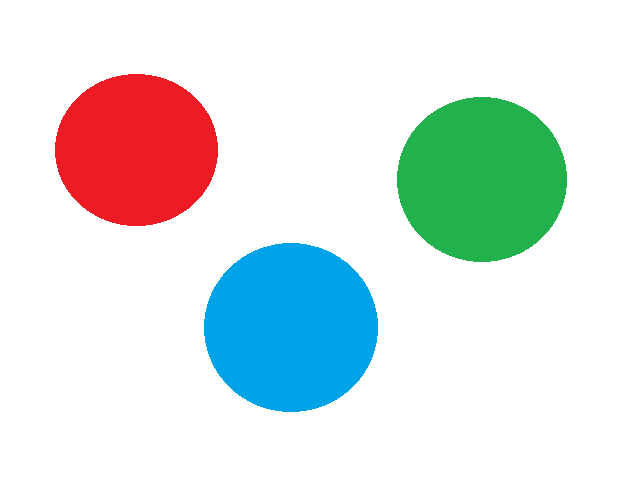

canal cinza


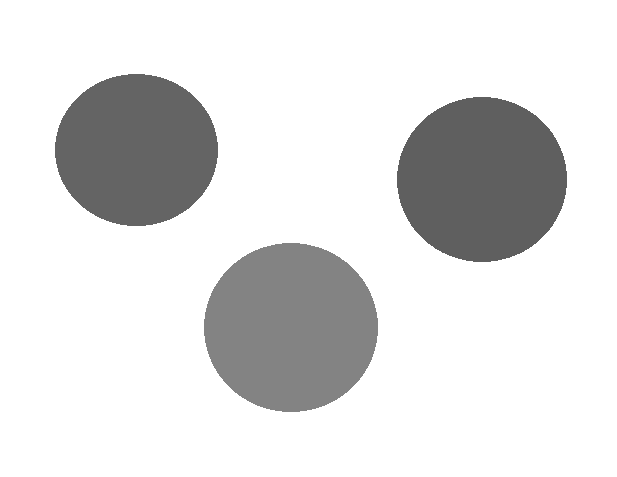

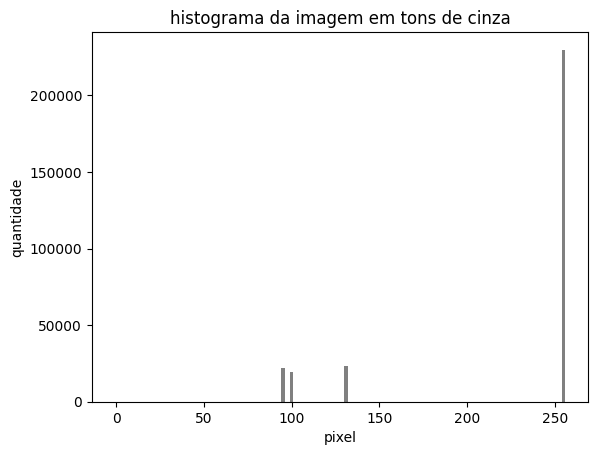

Remove Verde


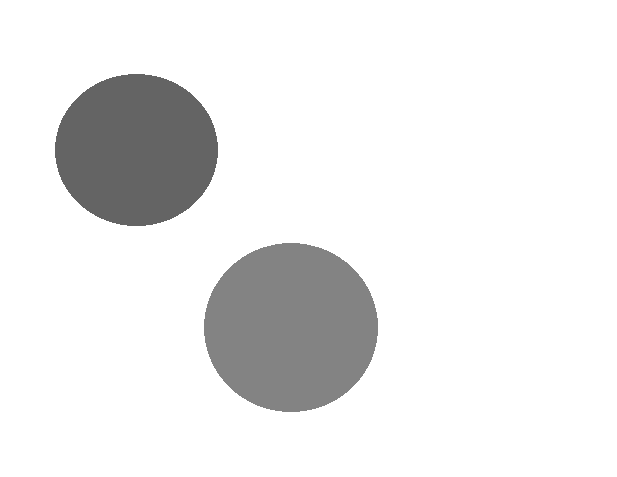

Remove Azul


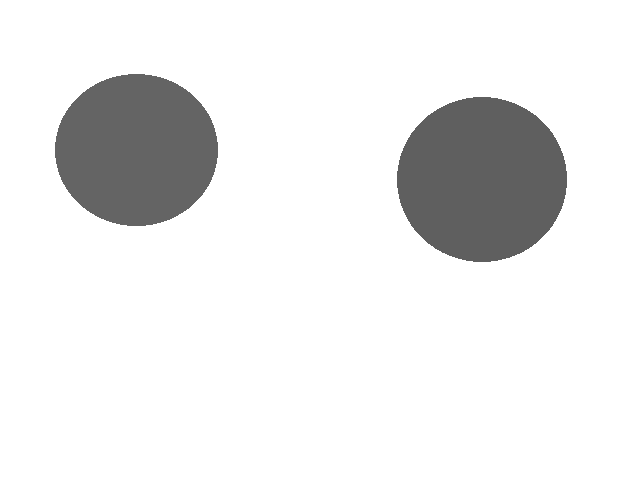

Remove Vermelho


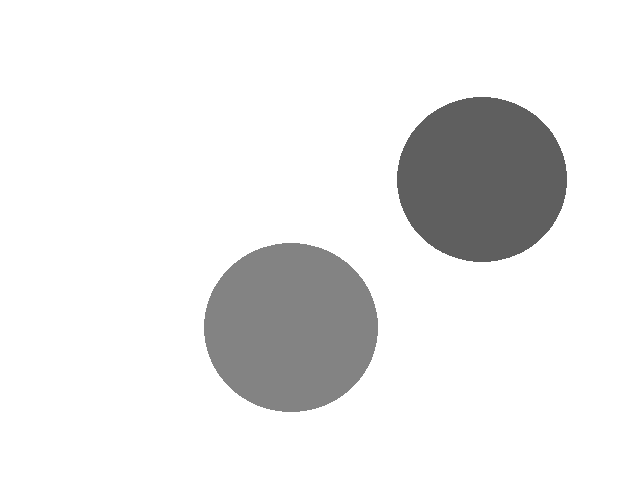

In [ ]:
# **********************************************
# AGRUPAMENTO POR LIMIAR COM 3 NÍVEIS
# **********************************************

# codigo da aula 24/02

# importacoes
import cv2 #visao computacional

import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np # trabalhar com matrizes

# leitura da imagem com a funcao imread()
img = cv2.imread('/foto3.png')
imagem = img.copy()
# a img eh armazenada na variavel imagem
# a imagem eh uma magriz de 3 dimensoes -> 3 canais RGB (red, green, blue), mas a ordem no python é bgr
# cada celula da matriz eh um pixel com valor de 0 a 255
# cada celula contem um inteiro de 8 bits sem sinal (uint8)
# cada pixel eh formado por uma tupla de 3 inteiros de 8 bits

# mostra img na tela com imshow
cv2_imshow(imagem)
cv2.waitKey(0) # espera o usuario apertar uma tecla para fechar a janela

# salvar a img no disco com a funcao imwrite()
cv2.imwrite('imagem2_copia.jpg', imagem) # salva a img com o nome 'imagem_copia.jpg'

# ------- FILTROS DE CORES BGR --------

# (b,g,r) = imagem[0,0] -> orgem no python é bgr

# matrizes de zeros com numpy para criar os canais de cores

# criando as matrizes de zeros
canalBlue = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalGreen = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)
canalRed = numpy.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=numpy.uint8)

# preenchendo as matrizes para cada cor
canalBlue[:,:,0] = imagem[:,:,0]
canalGreen[:,:,1] = imagem[:,:,1]
canalRed[:,:,2] = imagem[:,:,2]

# --------- FILTRO DE TONS DE CINZA COM A MÉDIA DOS TENSORES --------

# tons de cinza é só o img shape 0 e o img shape 1
# pegar os valores e dividir por 3 primeiro

imgCinza = numpy.zeros((imagem.shape[0], imagem.shape[1]), dtype=numpy.uint8)

# for para calcular por cada canal
for i in range (0, imagem.shape[0]):
  for j in range (0, imagem.shape[1]):
    imgCinza[i,j] = (imagem[i][j].sum()//3) # media aritmetica dos canais

# exibindo
print("canal cinza")

cv2_imshow(imgCinza)

# **********************************************************************************************
# TAREFA AULA 03/03 ----> FAZER UM HISTOGRAMA COM OS TONS DE CINZA COM UMA LISTA
# **********************************************************************************************

# fazer a lista para guardar os valores da escala de cinzas, cada posicao representa a frequencia. A lista será o histograma

# cria eixo x com zeros
pixel = 256*[0]
for i in range (256):
  pixel[i] = i

# para fazer o histograma, temos que criar um for para varrer a imagem e obter as frequencias
# criando lista de frequencias (histograma)
histogramaCinza = 256 * [0]

# percorrendo a imagem em tons de cinza
for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    histogramaCinza[valor] += 1    # soma 1 na posicao correspondente

# nome do eixo x
plt.xlabel('pixel')
# nome do eixo y
plt.ylabel('quantidade')

# titulo do grafico
plt.title('histograma da imagem em tons de cinza')
plt.bar(pixel, histogramaCinza, color='gray', width = 2) # esse histograma deve ser o array com os valores de frequencia da imagem, citado em comentario anterior
plt.show()


# **********************************************************************************************
# TAREFA AULA 03/03 ----> AGRUPAMENTO POR LIMIAR COM 3 NÍVEIS
# **********************************************************************************************

# pegar uma imagem com 3 níveis de cores, com 3 picos de cor
# definir um ponto de corte no histograma para separar cada pico de cor
# Ponto de Corte escolhido como  após olhar no histograma de tons cinza

# REMOVENDO A BOLINHA VERDE *****************
removeVerde = numpy.zeros((imgCinza.shape[0], imgCinza.shape[1]), dtype=numpy.uint8)

for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]
    if valor > 80 and valor <= 95:
      removeVerde[i, j] = 255
    else:
      removeVerde[i, j] = valor

print("Remove Verde")
cv2_imshow(removeVerde)

# REMOVENDO A BOLINHA AZUL *****************
removeAzul = numpy.zeros((imgCinza.shape[0], imgCinza.shape[1]), dtype=numpy.uint8)

for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]     # valor do pixel (0 a 255)
    if valor > 100 and valor <= 150:
      removeAzul[i, j] = 255
    else:
      removeAzul[i, j] = valor

print("Remove Azul")
cv2_imshow(removeAzul)

# REMOVENDO A BOLINHA VERMELHA *****************
removeVermelho = numpy.zeros((imgCinza.shape[0], imgCinza.shape[1]), dtype=numpy.uint8)

for i in range(0, imgCinza.shape[0]):
  for j in range(0, imgCinza.shape[1]):
    valor = imgCinza[i, j]
    if valor < 110 and valor > 95:
      removeVermelho[i, j] = 255
    else:
      removeVermelho[i, j] = valor

print("Remove Vermelho")
cv2_imshow(removeVermelho)


# Aula 10/03

# Operações pontuais globais em imagens

- Função de transformação que relaciona a imagem original com a imagem destino

```f(r) = s = cr + l```

- Hiperparâmetros:
- s = novo valor do pixel destino
- r = valor do pixel original
- c = contraste da imagem (inclinação da curva)
- l = luminosidade/brilho
- Implementar a curva de Tom com as funções de transformação (Gráfico XY)
- Limitar em 255 (se passar, setar para 255)

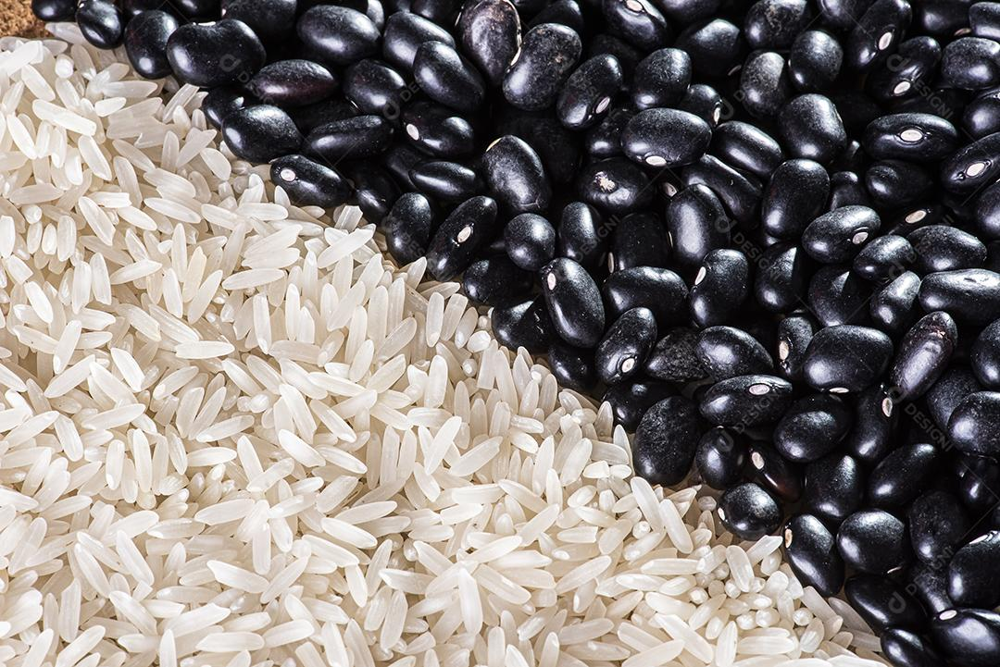

canal cinza


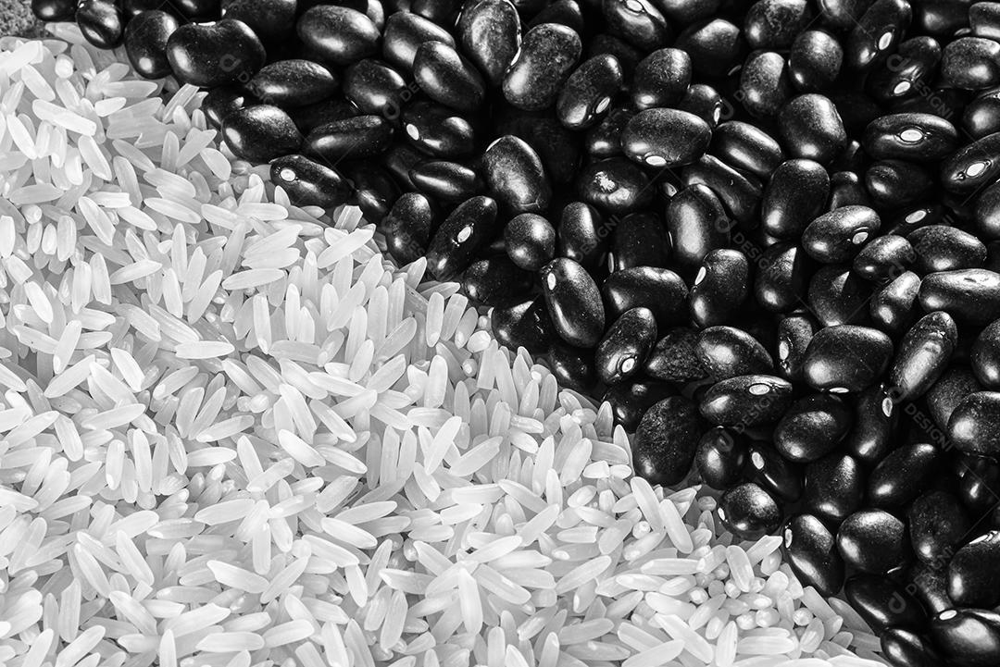

f(r) = cr + l


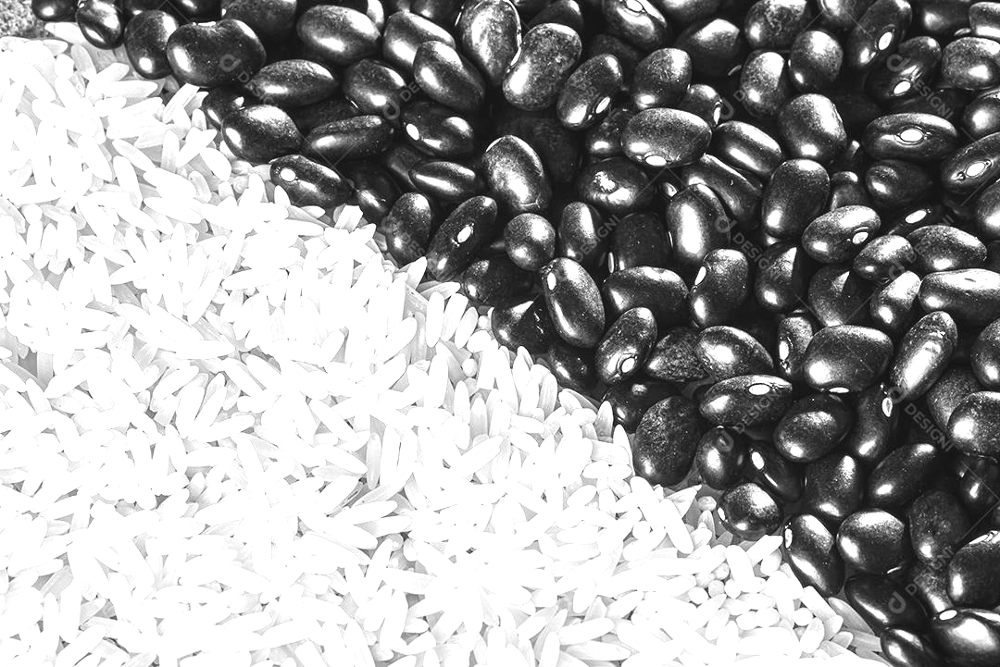

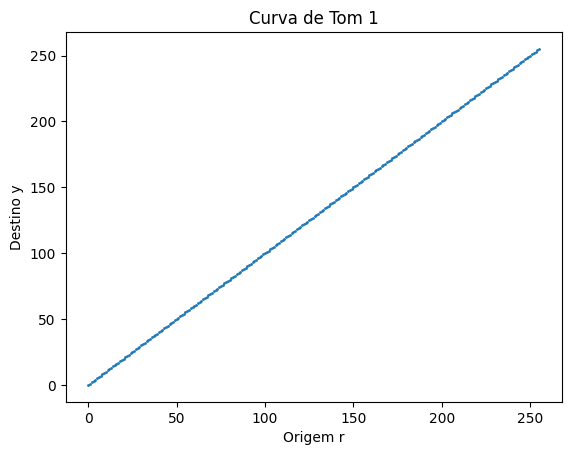

f(r) = 2r


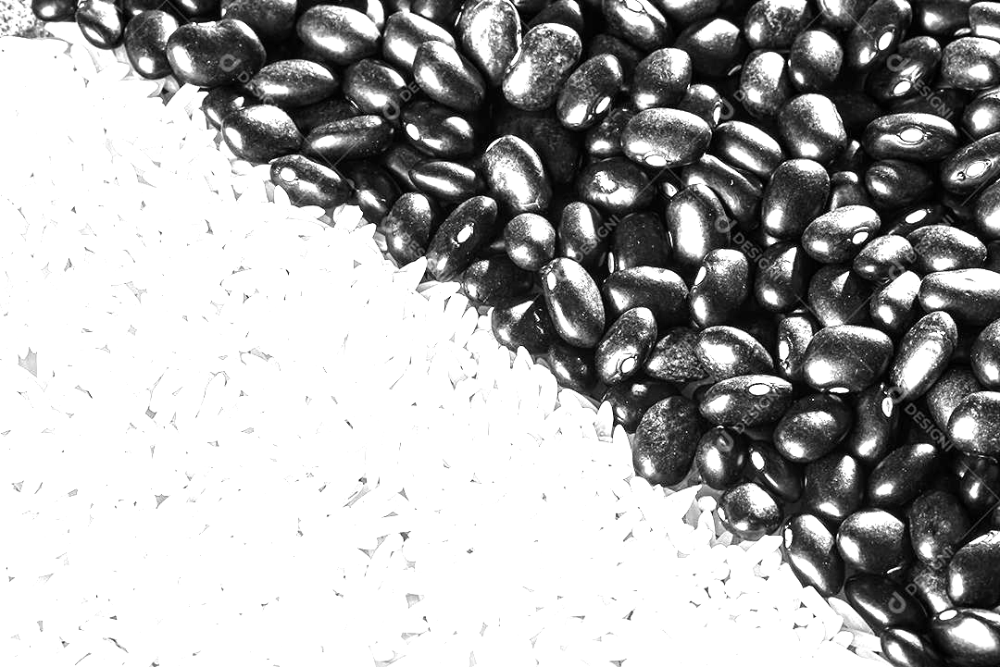

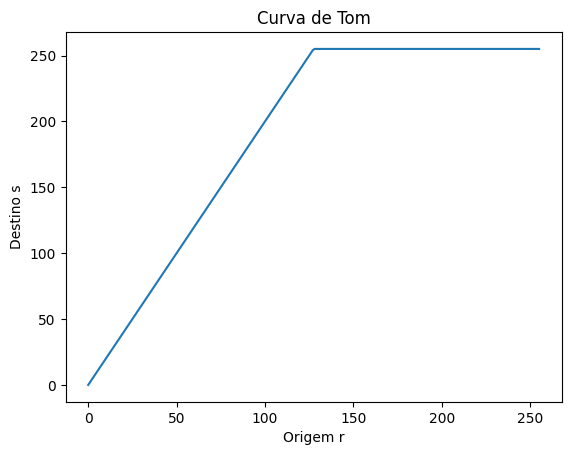

f(r) = r + 100


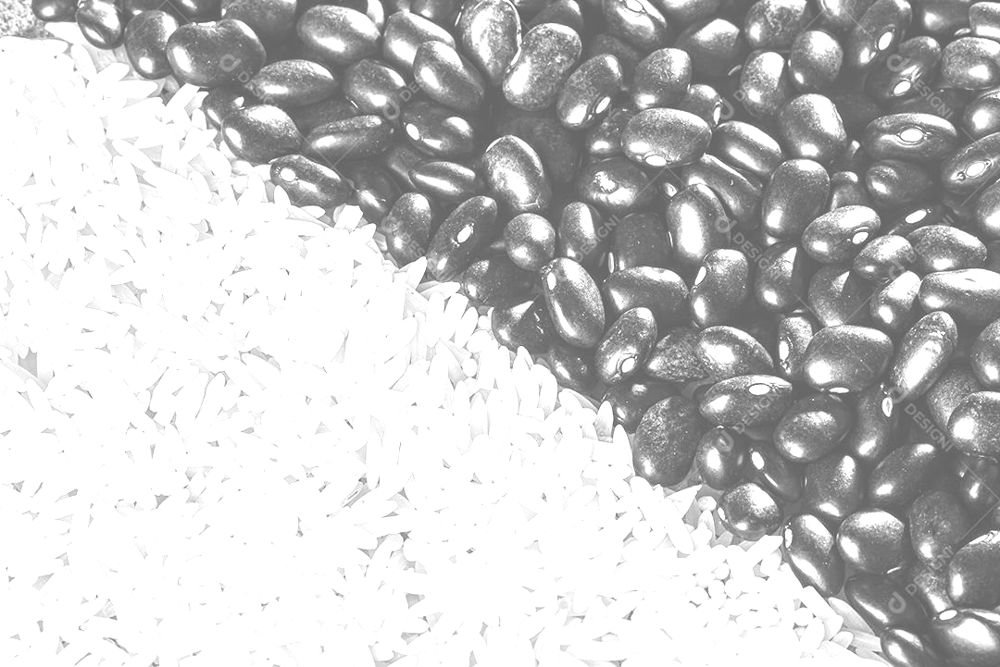

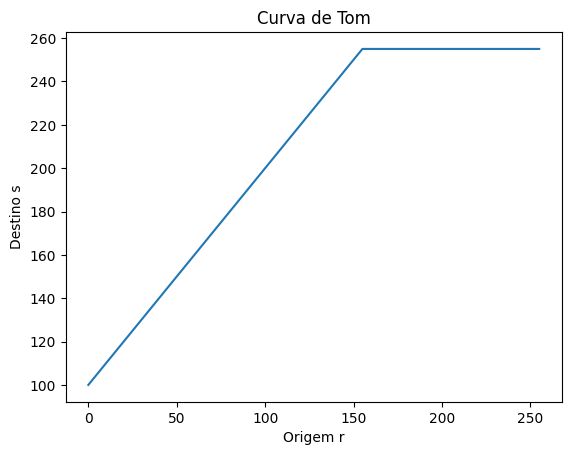

NEGATIVO


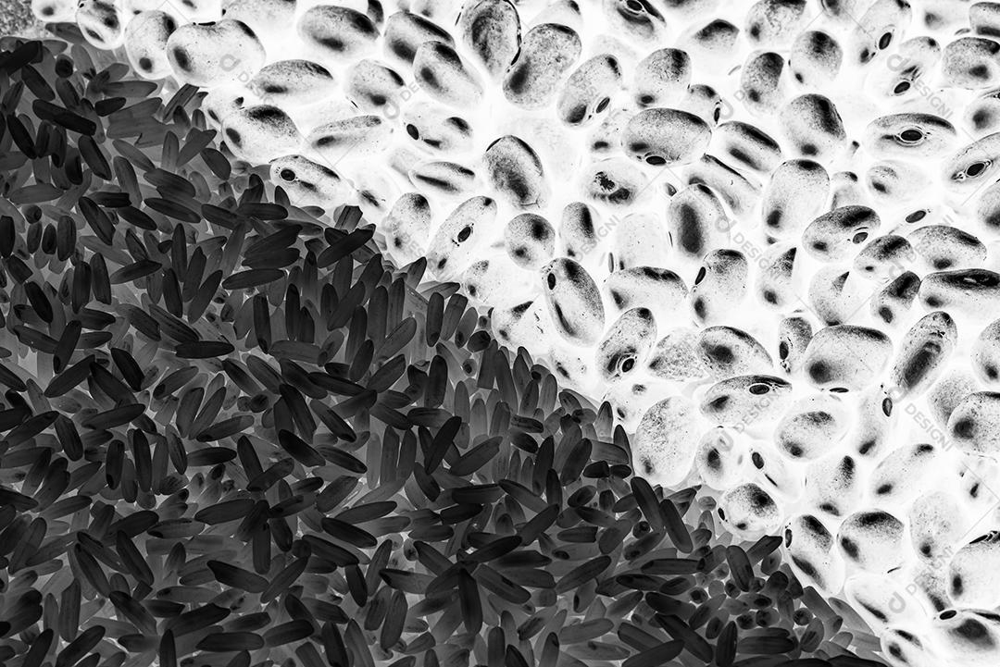

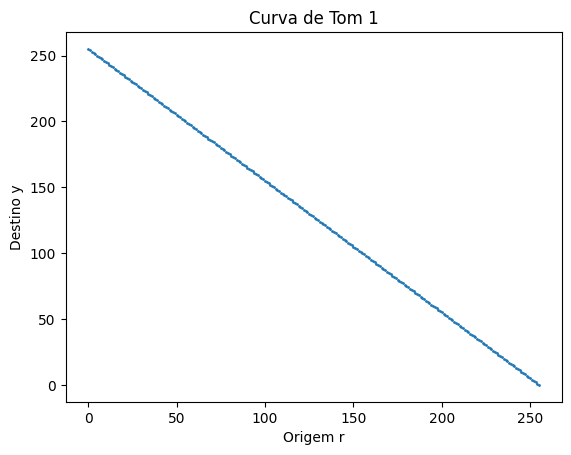

PARABOLICA


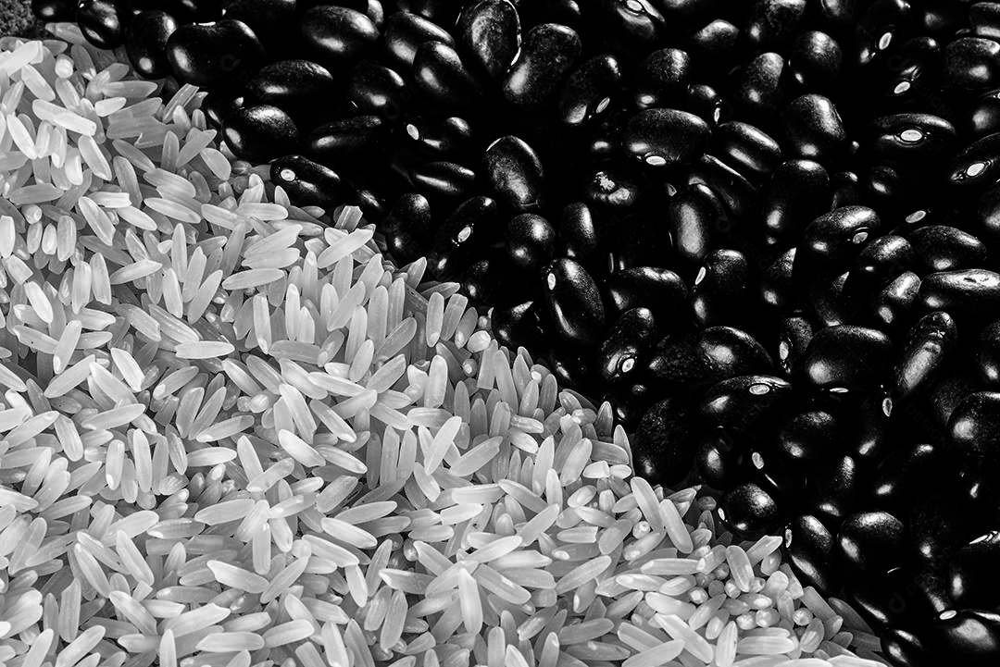

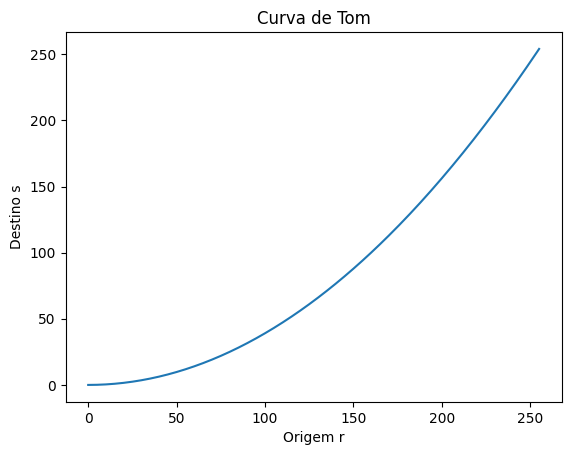

In [37]:
# ******************************************************************
# Implementação das funções e gráficos vistos em aula 10/03
# ******************************************************************

# passar por todos os pixels da imagem
# importacoes
import cv2 #visao computacional

import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import numpy as np # trabalhar com matrizes

# leitura da imagem com a funcao imread()
img = cv2.imread('/arroz_feijao.jpg')
imagem = img.copy()
cv2_imshow(imagem)
cv2.waitKey(0)
cv2.imwrite('arroz_feijao_copia.jpg', imagem)

# passar a imagem para tom de cinza
# criando as matrizes de zeros
canalBlue = np.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=np.uint8)
canalGreen = np.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=np.uint8)
canalRed = np.zeros((imagem.shape[0], imagem.shape[1], imagem.shape[2]), dtype=np.uint8)

# preenchendo as matrizes para cada cor
canalBlue[:,:,0] = imagem[:,:,0]
canalGreen[:,:,1] = imagem[:,:,1]
canalRed[:,:,2] = imagem[:,:,2]

# --------- FILTRO DE TONS DE CINZA COM A MÉDIA DOS TENSORES --------

# tons de cinza é só o img shape 0 e o img shape 1
# pegar os valores e dividir por 3 primeiro

imgCinza = np.zeros((imagem.shape[0], imagem.shape[1]), dtype=np.uint8)

# for para calcular por cada canal
for i in range (0, imagem.shape[0]):
  for j in range (0, imagem.shape[1]):
    imgCinza[i,j] = (imagem[i][j].sum()//3) # media aritmetica dos canais

# exibindo
print("canal cinza")

cv2_imshow(imgCinza)

def curva_tom(r, c, l, tipo):

  if tipo == 1:
    return c*r + l
  if tipo == 2:
    return 2 * r
  if tipo == 3:
    return r + 100
  if tipo == 4:
    return 255 - r
  if tipo == 5:
    return (((1/256)*r)**2) * 256

  return 0

# plotar grafico
def plota_curva(c, l, tipo):

  r = np.arange(256)   # valores de entrada (0 a 255)
  s = []

  for valor in r:
    y = curva_tom(valor, c, l, tipo)

    # limitar valores entre 0 e 255
    if y < 0:
      y = 0
    if y > 255:
      y = 255

    s.append(y)

  plt.plot(r, s)
  plt.xlabel("Origem r")
  plt.ylabel("Destino s")
  plt.title("Curva de Tom")
  plt.show()


# funcao para aplicar a transformacao pixel a pixel
def aplica_curva(imgCinza, c, l, tipo):

  imgNova = np.zeros(imgCinza.shape, dtype=np.float32)

  for i in range(0, imgCinza.shape[0]):
    for j in range(0, imgCinza.shape[1]):

      r = int(imgCinza[i,j])
      valor = curva_tom(r, c, l, tipo)

      # limitar valores entre 0 e 255
      if valor < 0:
        valor = 0
      if valor > 255:
        valor = 255

      imgNova[i,j] = valor

  return imgNova.astype(np.uint8)


c = 1.3
l = 20

# primeira funcao
print("f(r) = cr + l")
nova = aplica_curva(imgCinza, c, l, 1)
cv2_imshow(nova)
r = np.arange(256)
s = np.arange(256)
plt.scatter(r, s, s=1)
plt.xlabel("Origem r")
plt.ylabel("Destino y")
plt.title("Curva de Tom 1")
plt.show()

# segunda funcao
print("f(r) = 2r")
nova2 = aplica_curva(imgCinza, c, l, 2)
cv2_imshow(nova2)
plota_curva(c,l,2)

# terceira funcao
print("f(r) = r + 100")
nova3 = aplica_curva(imgCinza, c, l, 3)
cv2_imshow(nova3)
plota_curva(c,l,3)

# quarta funcao
print("NEGATIVO")
nova4 = aplica_curva(imgCinza, c, l, 4)
cv2_imshow(nova4)
r = np.arange(256)
r_inv = r[::-1]
s = np.arange(256)
plt.scatter(r_inv, s, s=1)
plt.xlabel("Origem r")
plt.ylabel("Destino y")
plt.title("Curva de Tom 1")
plt.show()


# quarta funcao
print("PARABOLICA")
nova5 = aplica_curva(imgCinza, c, l, 5)
cv2_imshow(nova5)
plota_curva(c,l,5)